In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import cv2
import os
from PIL import Image
import random
import matplotlib.pyplot as plt

In [2]:
NORMAL = "train\\normal"
DISEASE = "train\\disease"

In [3]:
data_set = []
categories = os.listdir('train')
for category in categories:
    imgs = os.listdir(os.path.join('train', category))
    for img in imgs:
        img1 = Image.open(os.path.join('train', category, img))
        img2 = img1.resize((224, 224))
        img_flat0 = np.array(img2)
        img_flat1 = img_flat0.flatten()
        data_set.append([img_flat1.tolist(), categories.index(category)])
data_set

[[[183,
   196,
   145,
   189,
   192,
   149,
   137,
   135,
   91,
   161,
   170,
   109,
   120,
   147,
   63,
   138,
   174,
   82,
   104,
   136,
   51,
   114,
   147,
   51,
   105,
   139,
   45,
   122,
   154,
   72,
   138,
   172,
   71,
   122,
   158,
   49,
   112,
   144,
   57,
   122,
   154,
   69,
   129,
   164,
   63,
   125,
   159,
   70,
   117,
   150,
   56,
   133,
   162,
   66,
   196,
   221,
   136,
   169,
   193,
   122,
   98,
   125,
   57,
   148,
   179,
   106,
   156,
   189,
   113,
   151,
   183,
   110,
   137,
   168,
   99,
   148,
   178,
   108,
   164,
   194,
   122,
   154,
   182,
   108,
   134,
   163,
   84,
   139,
   167,
   81,
   141,
   171,
   75,
   146,
   173,
   87,
   97,
   120,
   48,
   80,
   100,
   38,
   81,
   100,
   40,
   103,
   122,
   58,
   86,
   106,
   35,
   133,
   154,
   81,
   145,
   169,
   92,
   141,
   168,
   86,
   156,
   185,
   101,
   171,
   198,
   118,
   125,
   146,
   75,
   

In [4]:
random.seed(42)
random.shuffle(data_set)
data_set

[[[134,
   169,
   14,
   111,
   148,
   4,
   150,
   193,
   22,
   186,
   230,
   7,
   158,
   190,
   5,
   98,
   118,
   26,
   90,
   118,
   50,
   149,
   189,
   56,
   173,
   210,
   25,
   192,
   224,
   15,
   175,
   206,
   7,
   111,
   139,
   29,
   59,
   89,
   28,
   102,
   144,
   12,
   117,
   157,
   7,
   104,
   145,
   1,
   121,
   165,
   0,
   134,
   173,
   18,
   140,
   181,
   19,
   122,
   166,
   0,
   116,
   156,
   8,
   106,
   146,
   7,
   135,
   178,
   15,
   98,
   135,
   7,
   103,
   136,
   31,
   155,
   186,
   81,
   64,
   93,
   1,
   117,
   151,
   13,
   157,
   198,
   8,
   143,
   181,
   4,
   154,
   188,
   16,
   155,
   193,
   9,
   139,
   180,
   0,
   129,
   170,
   4,
   107,
   143,
   10,
   109,
   139,
   35,
   82,
   107,
   25,
   143,
   173,
   59,
   140,
   167,
   89,
   93,
   121,
   48,
   91,
   130,
   6,
   101,
   138,
   18,
   97,
   129,
   17,
   102,
   130,
   22,
   155,
   190,
 

In [5]:
X = []
y = []
for xx, yy in data_set:
    X.append(xx)
    y.append(yy)
y

[1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1]

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)
y_train

[0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0]

In [7]:
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [8]:
model.score(X_test, y_test)

0.65

In [9]:
results = model.predict(X_test)
results

array([0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1])

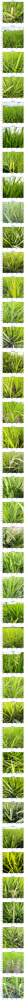

In [10]:
_, axs = plt.subplots(len(results), 1, figsize=(224, 224))
axs = axs.flatten()
for ax, img, result in zip(axs, X_test, results):
    if result == 0:
        ax.title.set_text("Disease")
        ax.imshow(np.asarray(img).reshape((224, 224, 3)))
    else:
        ax.title.set_text("Normal")
        ax.imshow(np.asarray(img).reshape((224, 224, 3)))
plt.show()